*Content of this notebook*: This notebook just contains the code to modify the coloring of the clusters for better visualization

In [1]:
!conda info --envs

# conda environments:
#
base                     C:\Users\aleja\anaconda3
CommonOperations         C:\Users\aleja\anaconda3\envs\CommonOperations
Palantir_Env1            C:\Users\aleja\anaconda3\envs\Palantir_Env1
scRNA_env                C:\Users\aleja\anaconda3\envs\scRNA_env
scvelo_env               C:\Users\aleja\anaconda3\envs\scvelo_env
singlecellEnv            C:\Users\aleja\anaconda3\envs\singlecellEnv
textenv               *  C:\Users\aleja\anaconda3\envs\textenv



In [2]:
import os

In [3]:
os. getcwd() 

'D:\\BIOINFO\\POURQUIE\\HOX_project\\Analysis_SCANPY\\SCRIPTS_for_Zenodo\\ROUND2'

In [4]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt

In [5]:
sc.settings.verbosity = 3           
sc.logging.print_versions()  
sc.settings.set_figure_params(dpi=300, facecolor='white')

-----
anndata     0.10.7
scanpy      1.10.0
-----
PIL                         8.4.0
anyio                       NA
arrow                       1.3.0
asttokens                   NA
attr                        23.2.0
attrs                       23.2.0
babel                       2.14.0
backcall                    0.2.0
bottleneck                  1.3.7
brotli                      NA
certifi                     2024.08.30
cffi                        1.16.0
chardet                     5.2.0
charset_normalizer          3.3.2
cloudpickle                 3.0.0
colorama                    0.4.6
comm                        0.2.1
cycler                      0.12.1
cython_runtime              NA
cytoolz                     0.12.3
dask                        2024.2.0
dateutil                    2.8.2
debugpy                     1.8.1
decorator                   5.1.1
defusedxml                  0.7.1
exceptiongroup              1.2.0
executing                   2.0.1
fastjsonschema              NA

### Loading WT sample

In [6]:
WT = sc.read_h5ad('D:/BIOINFO/POURQUIE/HOX_project/Analysis_SCANPY/H5AD/20241113_WT_qc_filtered_dr_clustered_ano.h5ad')

In [7]:
# check that the matrix looks like normalized counts
print(WT.X[1:10,1:10])

  (3, 4)	0.5358017683029175
  (7, 4)	1.177945852279663
  (4, 5)	0.46809160709381104


In [8]:
print(WT.raw.X[1:10,1:10]) 

  (3, 4)	0.5358017683029175
  (7, 4)	1.177945852279663
  (4, 5)	0.46809160709381104


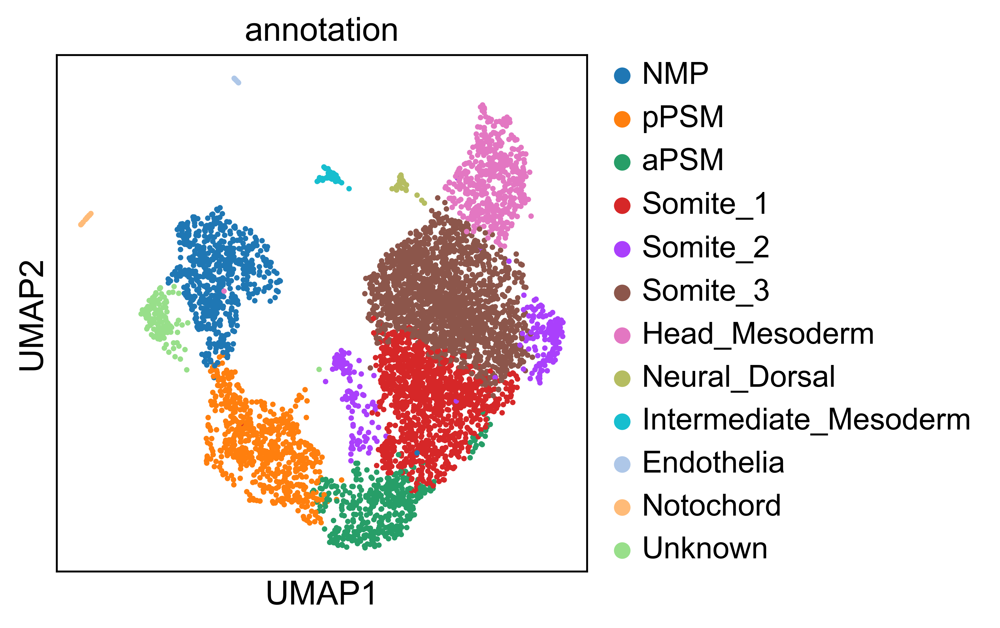

In [9]:
sc.pl.umap(WT, color="annotation")

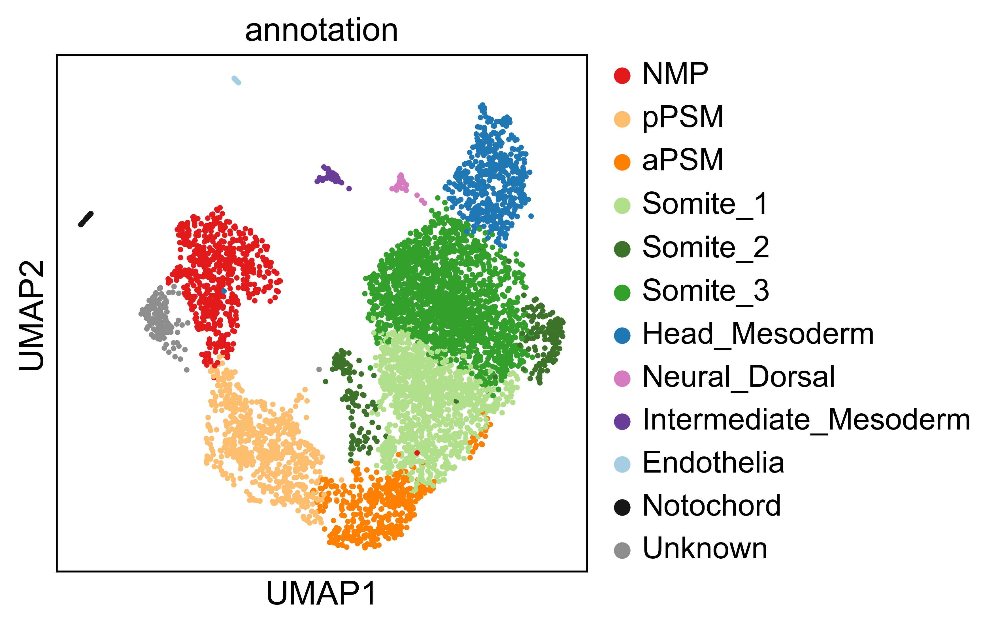

In [10]:
custom_colors = [
    '#e31a1c', '#fdbf6f', '#ff7f00',
    '#b2df8a', '#3d732a', '#33a02c',
    '#1f78b4', '#d67ac1', '#6a3d9a', 
    '#a6cee3', '#161717', '#8f8d8c'  
]

# Assign the custom colors
WT.uns["annotation_colors"] = custom_colors

# Plot the UMAP with custom colors
sc.pl.umap(WT, color="annotation")


### Loading HOX_KO sample

In [11]:
HOXKO = sc.read_h5ad('D:/BIOINFO/POURQUIE/HOX_project/Analysis_SCANPY/H5AD/20241113_HOXKO_qc_filtered_dr_clustered_ano.h5ad')

In [12]:
# check that the matrix looks like normalized counts
print(HOXKO.X[1:10,1:10])

  (1, 0)	0.42701777815818787
  (4, 3)	0.6657679080963135
  (7, 3)	0.44470882415771484
  (2, 4)	0.6416028738021851
  (5, 5)	0.5139382481575012


In [13]:
print(HOXKO.raw.X[1:10,1:10]) 

  (1, 0)	0.42701777815818787
  (4, 3)	0.6657679080963135
  (7, 3)	0.44470882415771484
  (2, 4)	0.6416028738021851
  (5, 5)	0.5139382481575012


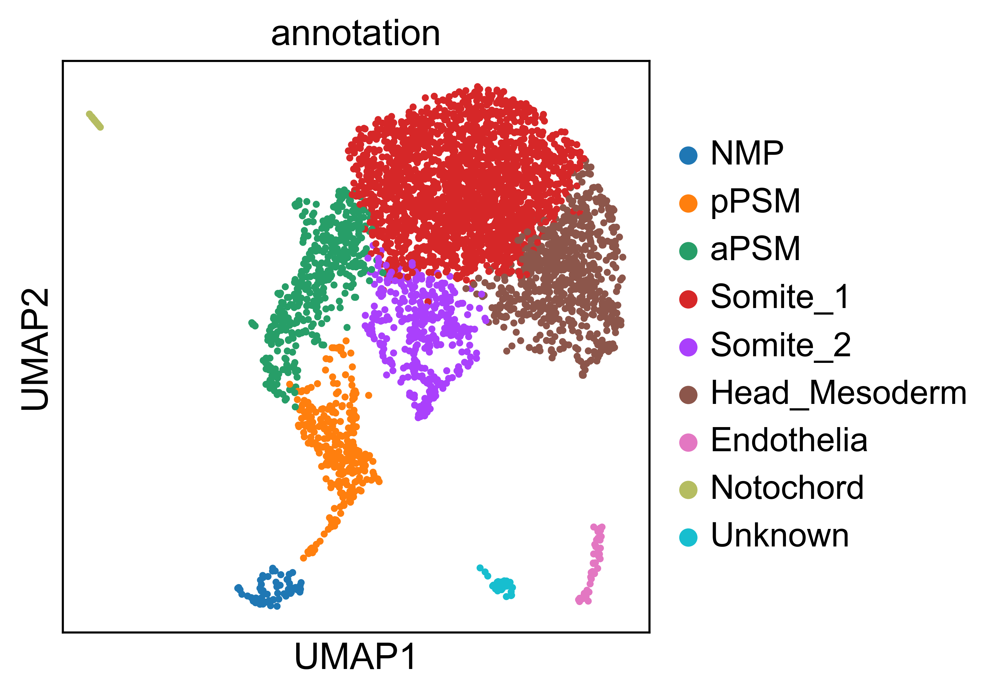

In [14]:
sc.pl.umap(HOXKO, color="annotation")

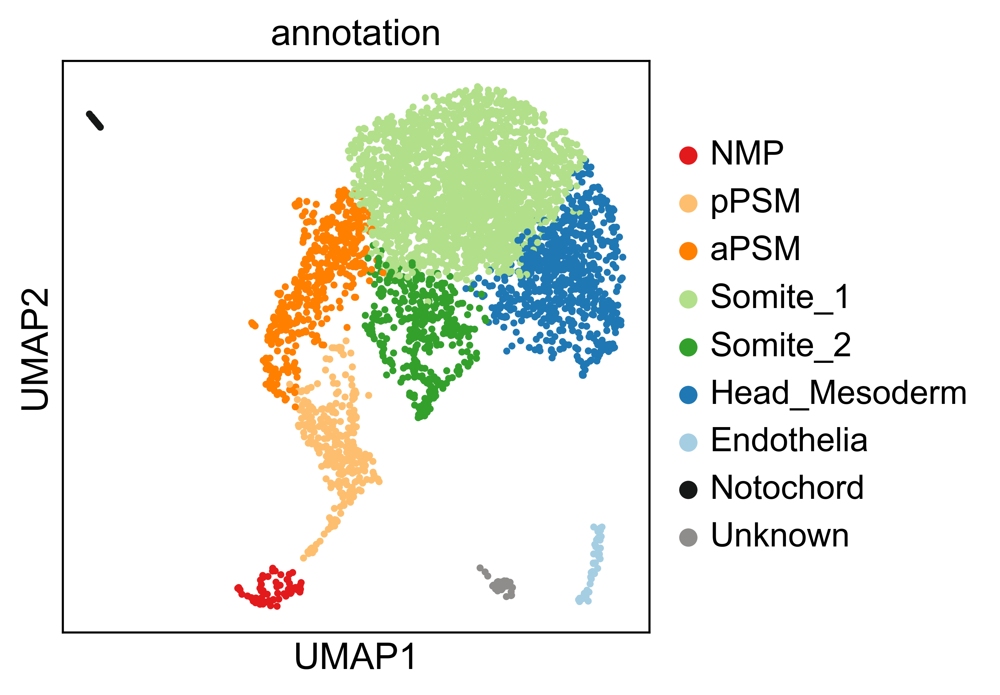

In [15]:
custom_colors2 = [
    '#e31a1c', '#fdbf6f', '#ff7f00',
    '#b2df8a', '#33a02c',
    '#1f78b4', 
    '#a6cee3', '#161717', '#8f8d8c'  # Add more colors if needed
]

# Assign the custom colors
HOXKO.uns["annotation_colors"] = custom_colors2

# Plot the UMAP with custom colors
sc.pl.umap(HOXKO, color="annotation")

### Loading Integrated Dataset

In [16]:
Integrated = sc.read_h5ad('D:/BIOINFO/POURQUIE/HOX_project/Analysis_SCANPY/H5AD/20241113_HOXsamples_all_qc_filtered_dr_Harmony_clustered_anno.h5ad')

In [17]:
# check that the matrix looks like normalized counts
print(Integrated.X[1:10,1:10])

  (0, 6)	0.547740638256073
  (3, 4)	0.33367305994033813
  (8, 4)	0.2874073386192322
  (8, 6)	0.510386049747467


In [18]:
print(Integrated.raw.X[1:10,1:10]) 

  (0, 6)	0.547740638256073
  (3, 4)	0.33367305994033813
  (8, 4)	0.2874073386192322
  (8, 6)	0.510386049747467


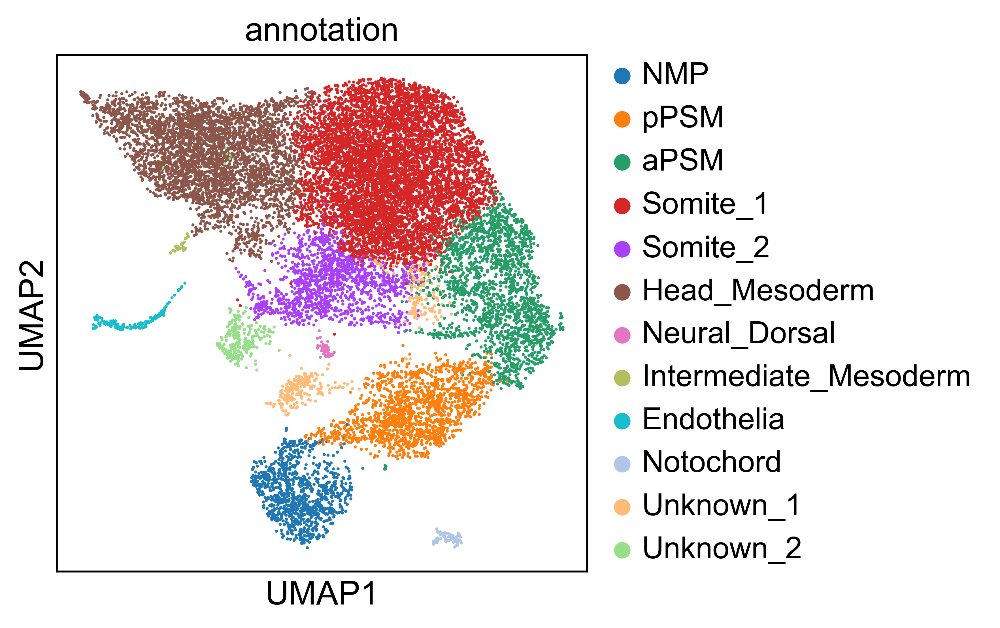

In [19]:
sc.pl.umap(Integrated, color="annotation")

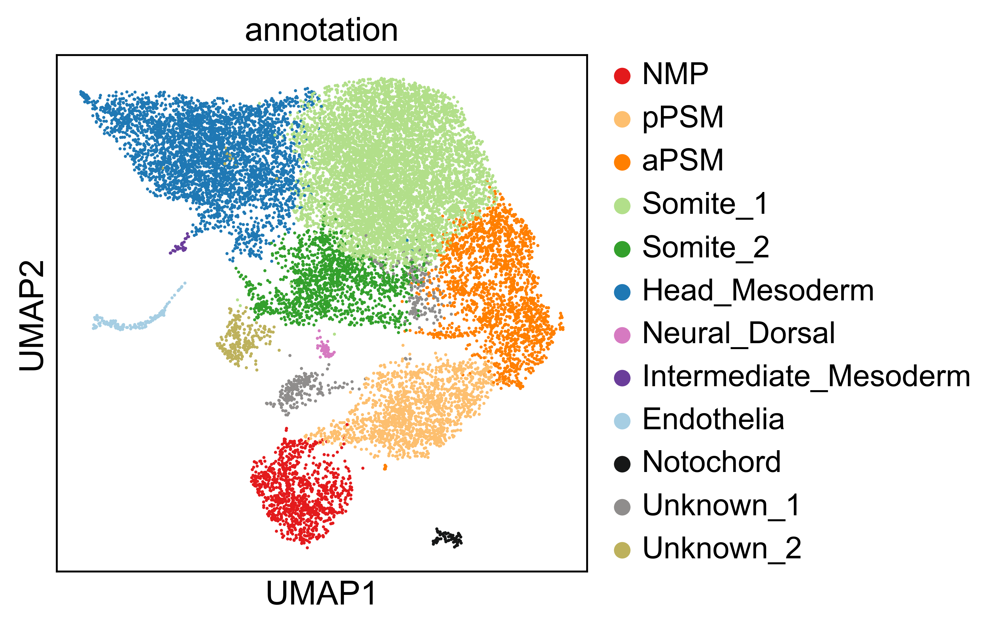

In [20]:
custom_colors3 = [
    '#e31a1c', '#fdbf6f', '#ff7f00',
    '#b2df8a', '#33a02c',
    '#1f78b4', '#d67ac1', '#6a3d9a', 
    '#a6cee3', '#161717', '#8f8d8c','#bdb15c' # Add more colors if needed
]

# Assign the custom colors
Integrated.uns["annotation_colors"] = custom_colors3

# Plot the UMAP with custom colors
sc.pl.umap(Integrated, color="annotation")

WT


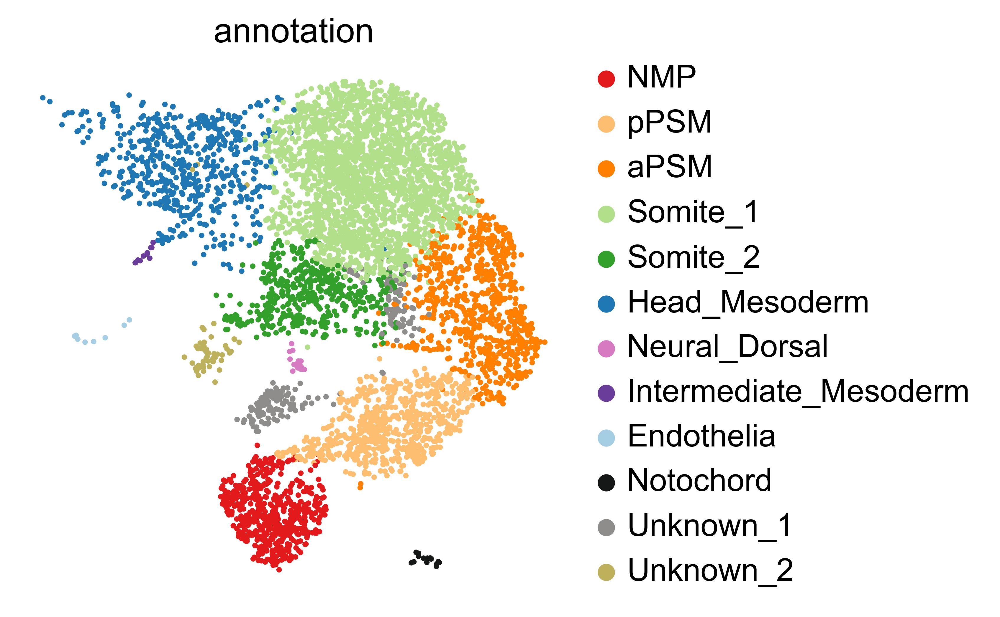

HOXD_KO


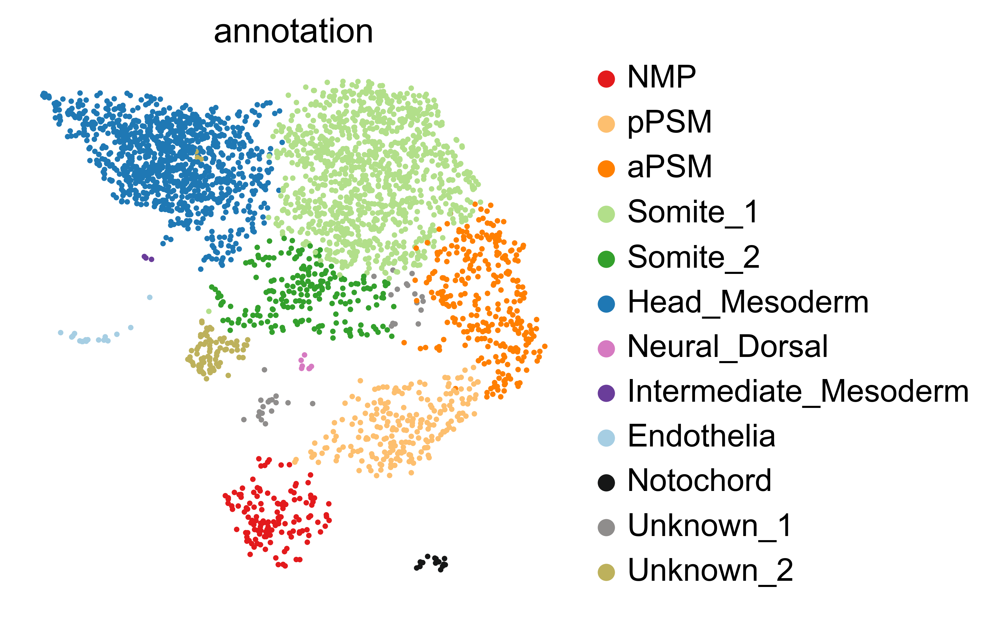

HOXBCD_KO


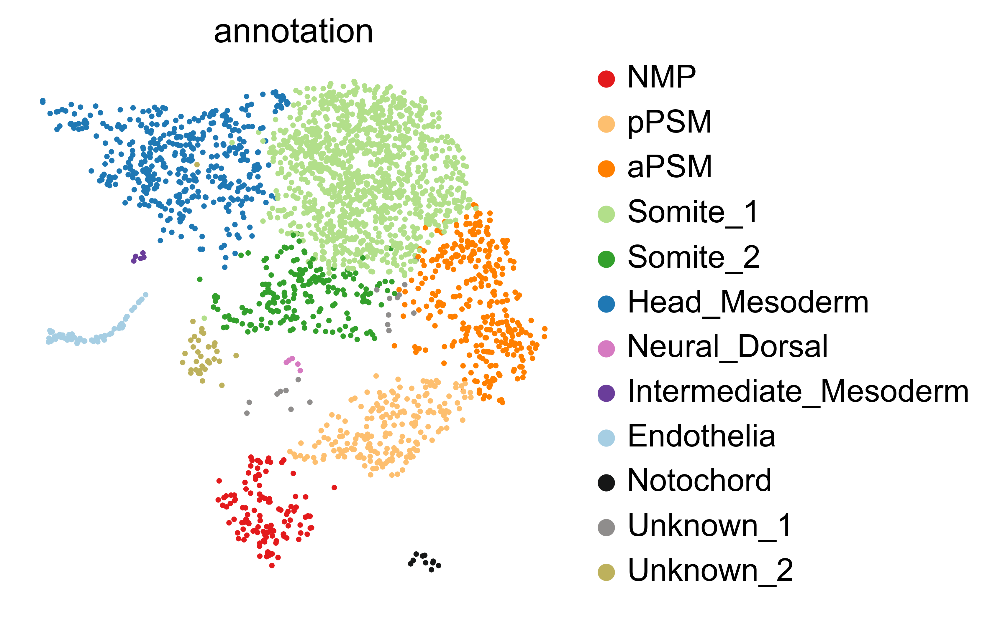

HOXCD_KO


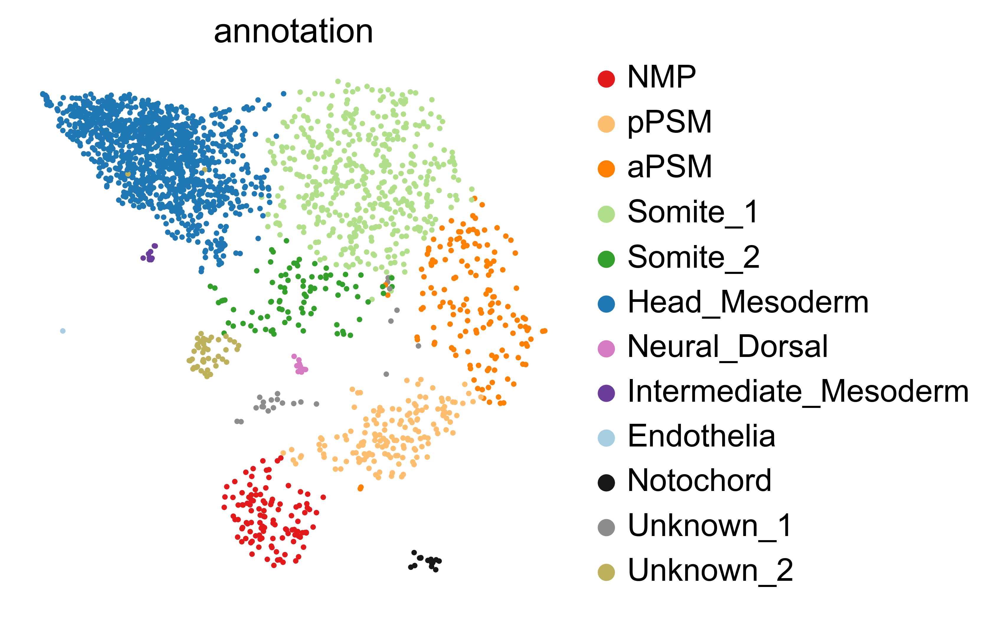

HOX_KO


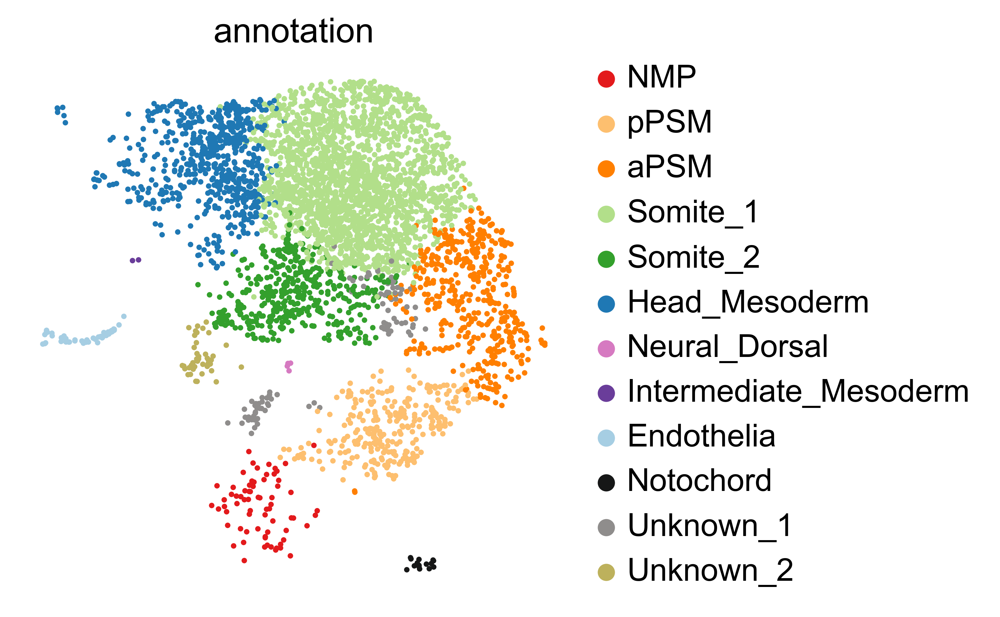

In [21]:
for i in ['WT', 'HOXD_KO','HOXBCD_KO','HOXCD_KO','HOX_KO']:
    print(i)
    sc.pl.umap(
    Integrated[Integrated.obs["sample"] == i], size=20,
    color=["annotation"],
    frameon=False )